In [359]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/birdsong-recognition/example_test_audio_metadata.csv
/kaggle/input/birdsong-recognition/sample_submission.csv
/kaggle/input/birdsong-recognition/train.csv
/kaggle/input/birdsong-recognition/test.csv
/kaggle/input/birdsong-recognition/example_test_audio_summary.csv
/kaggle/input/birdsong-recognition/example_test_audio/ORANGE-7-CAP_20190606_093000.pt623.mp3
/kaggle/input/birdsong-recognition/example_test_audio/BLKFR-10-CPL_20190611_093000.pt540.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC153881.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC423355.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC45484.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC109911.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC299486.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC474580.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC299484.mp3
/kaggle/input/birdsong-recognition/train_audio/rudduc/XC165233.mp3


Import necessary libraries

In [360]:
# numpy already imported
# pandas already imported
import matplotlib.pyplot as plt # for visualising data
%matplotlib inline
import seaborn as sns

import IPython.display as ipd # for playing audio files
import soundfile as sf # for reading and writing audio files
import audioread # reading and processing audio files
import os # file and directory manipulation 
import warnings
warnings.filterwarnings('ignore')

In [361]:
!pip install librosa==0.9.2

In [362]:
import librosa # for audio processing and audio feature extraction

Reading the train.csv file for Exploratory Data Analysis (EDA) to understand the structure and content of the dataset. Doing this will help in identifying patterns and anomalies(missing value and datatype issues) within the data. This can also highlight the importance of different features in the dataset and can be helpful in drawing important correlations and relationships between data columns.

> # EXPLORATORY DATA ANALYSIS

In [363]:
df = pd.read_csv("/kaggle/input/birdsong-recognition/train.csv")
df

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,...,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,...,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,...,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,...,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,no,yetvir,1 (mono),2019-05-15,both,28,XC477608.mp3,level,Yellow-throated Vireo,...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...
21371,3.5,no,yetvir,1 (mono),2017-05-14,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,...,500348,https://www.xeno-canto.org/500348,United States,Jacob Saucier,Vireo flavifrons_Yellow-throated Vireo,-77.3422,Not specified,15:00,Jacob Saucier,Creative Commons Attribution-NonCommercial-Sha...
21372,5.0,no,yetvir,1 (mono),2017-06-10,Not specified,96,XC501230.mp3,Not specified,Yellow-throated Vireo,...,501230,https://www.xeno-canto.org/501230,United States,Jacob Saucier,Vireo flavifrons_Yellow-throated Vireo,-77.3422,Not specified,13:30,Jacob Saucier,Creative Commons Attribution-NonCommercial-Sha...
21373,3.5,no,yetvir,2 (stereo),2009-05-06,level,35,XC54828.mp3,level,Yellow-throated Vireo,...,54828,https://www.xeno-canto.org/54828,United States,Mike Nelson,Vireo flavifrons_Yellow-throated Vireo,-83.9462,>10(s),9:45am,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...


This shows that dataset has 21375 rows and 35 columns.

In [364]:
df.head()

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,...,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,...,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,...,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,...,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...


In [365]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'sampling_rate', 'type', 'elevation', 'description', 'bitrate_of_mp3',
       'file_type', 'volume', 'background', 'xc_id', 'url', 'country',
       'author', 'primary_label', 'longitude', 'length', 'time', 'recordist',
       'license'],
      dtype='object')

This shows all the 35 columns in the dataset that we have to look into.

In [366]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     19575 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         19575 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

Here, the dataset info shows that, there are some columns like playback speed, bird_seen etc. where some null values are found. We have to deal with it, further.

In [367]:
df['rating'].unique()

array([3.5, 4. , 4.5, 5. , 3. , 2.5, 1.5, 1. , 2. , 0.5, 0. ])

We can see here, rating column has no issue of datatype and missing values. These rating values here may be representing the user experience of the quality of bird sounds recorded or may be representing that high-rated birds are the one that are more searched for. So, this column might be useful further. 

In [368]:
df.playback_used.unique()

array(['no', nan, 'yes'], dtype=object)

We see here that column has some nan values. As playback is just denoting whether some audio for the bird call or not, that may not be very useful for our purpose. 

In [369]:
df.playback_used.value_counts()

playback_used
no     18964
yes      611
Name: count, dtype: int64

Suppose, if we want to use the playback column, we need to deal with the the missing values, we can look above the most common value is 'no' so we can go for replacing the missing values with 'no'.

In [370]:
df.playback_used.fillna('no',inplace = True)


In [371]:
df.playback_used.unique()

array(['no', 'yes'], dtype=object)

In [372]:
df.ebird_code.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: ebird_code
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [373]:
df.ebird_code.unique()

array(['aldfly', 'ameavo', 'amebit', 'amecro', 'amegfi', 'amekes',
       'amepip', 'amered', 'amerob', 'amewig', 'amewoo', 'amtspa',
       'annhum', 'astfly', 'baisan', 'baleag', 'balori', 'banswa',
       'barswa', 'bawwar', 'belkin1', 'belspa2', 'bewwre', 'bkbcuc',
       'bkbmag1', 'bkbwar', 'bkcchi', 'bkchum', 'bkhgro', 'bkpwar',
       'bktspa', 'blkpho', 'blugrb1', 'blujay', 'bnhcow', 'boboli',
       'bongul', 'brdowl', 'brebla', 'brespa', 'brncre', 'brnthr',
       'brthum', 'brwhaw', 'btbwar', 'btnwar', 'btywar', 'buffle',
       'buggna', 'buhvir', 'bulori', 'bushti', 'buwtea', 'buwwar',
       'cacwre', 'calgul', 'calqua', 'camwar', 'cangoo', 'canwar',
       'canwre', 'carwre', 'casfin', 'caster1', 'casvir', 'cedwax',
       'chispa', 'chiswi', 'chswar', 'chukar', 'clanut', 'cliswa',
       'comgol', 'comgra', 'comloo', 'commer', 'comnig', 'comrav',
       'comred', 'comter', 'comyel', 'coohaw', 'coshum', 'cowscj1',
       'daejun', 'doccor', 'dowwoo', 'dusfly', 'eargre',

In [374]:
df.ebird_code.nunique()

264

Here, we can see that the column ebird_code has no missing values and this basically represents the some sort of code for the species of the bird. So, this column can be very usefule, while we will be classifying the sounds of bird. But as the dtype of the column is object, but we need numerical values for our model, so we can look for label encoding also.

In [375]:
df.channels.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: channels
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [376]:
df.channels.unique()

array(['1 (mono)', '2 (stereo)'], dtype=object)

The channels column is showing here that whether the recorded sound is mono or stereo type, we can see there are no null values. This column is not very useful as we will be using librosa for audio processing which converts the stereo audio type to mono on its own.

In [377]:
df.date.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: date
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [378]:
df.date.unique()

array(['2013-05-25', '2013-05-27', '2013-05-30', ..., '2009-05-07',
       '2019-01-04', '2019-09-25'], dtype=object)

Here, the date column can be of use in context to birds. If we go for extracting the month details from the date, we will be able to know which species of birds appear in which month or season.

In [379]:
df[['year', 'month', 'day']] = df['date'].str.split('-', expand=True)

In [380]:
df.month.unique()

array(['05', '06', '07', '02', '12', '04', '11', '03', '10', '09', '01',
       '08', '00'], dtype=object)

Here, we find that there is a month value '00'. This obviously has no meaning. Let's first chcek how many times this value has occured in month column.

In [381]:
df.month.value_counts()

month
05    4562
06    4533
04    2529
07    2020
03    1674
08    1099
02     916
11     831
10     820
01     819
12     802
09     736
00      34
Name: count, dtype: int64

month value '00' has occured the least (just 34 times). So, to correct this, we can try for replacing this value with the month value in which most birds have appeared,i.e, month '05'. 

In [382]:
df['month'] = df['month'].replace('00', '05')

In [383]:
df.month.unique()

array(['05', '06', '07', '02', '12', '04', '11', '03', '10', '09', '01',
       '08'], dtype=object)

Here, the dtype of month values is object we can convert that to numeric for feeding into model.

In [384]:
df = df.drop(['year', 'day'], axis=1)

year and day values are not very useful so we can also drop these

In [385]:
df.pitch.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: pitch
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [386]:
df.pitch.unique()

array(['Not specified', 'both', 'increasing', 'level', 'decreasing'],
      dtype=object)

In [387]:
df.pitch.value_counts()

pitch
Not specified    15155
level             3149
both              2077
decreasing         528
increasing         466
Name: count, dtype: int64

In [388]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'sampling_rate', 'type', 'elevation', 'description', 'bitrate_of_mp3',
       'file_type', 'volume', 'background', 'xc_id', 'url', 'country',
       'author', 'primary_label', 'longitude', 'length', 'time', 'recordist',
       'license', 'month'],
      dtype='object')

In [389]:
df.speed.value_counts()

speed
Not specified    15046
level             5079
both               782
accelerating       326
decelerating       142
Name: count, dtype: int64

In [390]:
df.species.value_counts()

species
Alder Flycatcher        100
Pied-billed Grebe       100
Northern Waterthrush    100
Field Sparrow           100
Evening Grosbeak        100
                       ... 
LeConte's Thrasher       20
Costa's Hummingbird      19
Hooded Merganser         19
Bufflehead               15
Redhead                   9
Name: count, Length: 264, dtype: int64

In [391]:
df.number_of_notes.unique()

array(['Not specified', '1-3', '4-6', '7-20', '>20'], dtype=object)

In [392]:
df.title.unique()

array(['XC134874 Alder Flycatcher (Empidonax alnorum)',
       'XC135454 Alder Flycatcher (Empidonax alnorum)',
       'XC135455 Alder Flycatcher (Empidonax alnorum)', ...,
       'XC501230 Yellow-throated Vireo (Vireo flavifrons)',
       'XC54828 Yellow-throated Vireo (Vireo flavifrons)',
       'XC55761 Yellow-throated Vireo (Vireo flavifrons)'], dtype=object)

In [393]:
df.title.nunique()

21375

Here the title value is unique for each sound file, it seems like a unique ID for a single bird. 

In [394]:
df.secondary_labels.nunique()

5385

In [395]:
df.secondary_labels.unique()

array(["['Empidonax minimus_Least Flycatcher', 'Leiothlypis peregrina_Tennessee Warbler', 'Dumetella carolinensis_Gray Catbird', 'Spizella pusilla_Field Sparrow']",
       '[]',
       "['Dumetella carolinensis_Gray Catbird', 'Bombycilla cedrorum_Cedar Waxwing']",
       ...,
       "['Dryobates pubescens_Downy Woodpecker', 'Polioptila caerulea_Blue-gray Gnatcatcher', 'Setophaga americana_Northern Parula', 'Cardinalis cardinalis_Northern Cardinal', 'Buteo lineatus_Red-shouldered Hawk']",
       "['Vireo olivaceus_Red-eyed Vireo', 'Polioptila caerulea_Blue-gray Gnatcatcher']",
       "['Setophaga dominica_Yellow-throated Warbler']"], dtype=object)

Secondary labels can also be used for classification but they do not clear denote the name of the bird or there species, so using ebird_code values and species values are better labels for the classification purpose. As, this does not reveal any new info, we can also go for dropping this column.

In [396]:
df.bird_seen.value_counts()

bird_seen
yes    16211
no      3364
Name: count, dtype: int64

In [397]:
df.bird_seen.fillna('yes', inplace=True)

In [398]:
df.bird_seen.unique()

array(['yes', 'no'], dtype=object)

This column might be representing whether the bird was seen at time of recording their sounds or not

In [399]:
df.sci_name.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: sci_name
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [400]:
df.sci_name.nunique()

264

In [401]:
df.sci_name.unique()

array(['Empidonax alnorum', 'Recurvirostra americana',
       'Botaurus lentiginosus', 'Corvus brachyrhynchos', 'Spinus tristis',
       'Falco sparverius', 'Anthus rubescens', 'Setophaga ruticilla',
       'Turdus migratorius', 'Mareca americana', 'Scolopax minor',
       'Spizelloides arborea', 'Calypte anna', 'Myiarchus cinerascens',
       'Calidris bairdii', 'Haliaeetus leucocephalus', 'Icterus galbula',
       'Riparia riparia', 'Hirundo rustica', 'Mniotilta varia',
       'Megaceryle alcyon', 'Artemisiospiza belli', 'Thryomanes bewickii',
       'Coccyzus erythropthalmus', 'Pica hudsonia', 'Setophaga fusca',
       'Poecile atricapillus', 'Archilochus alexandri',
       'Pheucticus melanocephalus', 'Setophaga striata',
       'Amphispiza bilineata', 'Sayornis nigricans', 'Passerina caerulea',
       'Cyanocitta cristata', 'Molothrus ater', 'Dolichonyx oryzivorus',
       'Chroicocephalus philadelphia', 'Strix varia',
       'Euphagus cyanocephalus', 'Spizella breweri', 'Certhia 

This looks similar to species name column but the only differnece is these are not common names rather these are their scientific names.

In [402]:
df.location.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: location
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [403]:
df.location.unique()

array([' Grey Cloud Dunes SNA, Washington, Minnesota',
       " Carver's Gap Parking area, Roan Mountain State Park, North Carolina",
       ' Scales, near Wilson Creek, Grayson, Virginia', ...,
       ' Sprewell Bluff WMA, Pigeon Creek Tract',
       ' Mimbres, Grant County, New Mexico',
       ' Park Headquarters Rd W, Sugarlands, Great Smoky Mountains National Park, Tennessee'],
      dtype=object)

This column shows the exact locations where the bird sounds were observed and recorded, we can keep this column for displaying which was seen where on map.

In [404]:
df.latitude

0         44.793
1        36.1065
2        36.1065
3        36.1065
4        36.1065
          ...   
21370    39.5734
21371    38.3619
21372    38.3619
21373    36.0008
21374    35.6878
Name: latitude, Length: 21375, dtype: object

In [405]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     21375 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         21375 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

In [406]:
df.sampling_rate.unique()

array(['48000 (Hz)', '44100 (Hz)', '16000 (Hz)', '22050 (Hz)',
       '24000 (Hz)', '32000 (Hz)', '8000 (Hz)', '11025 (Hz)'],
      dtype=object)

Actually, we do not need this sampling rate values. As we are using the librosa library, it keeps the sampling rate constant(22,050 Hz) by default. If we would have scipy library for audio loading and processing, then this column would have been important because its requires sampling rate to be mentioned explicitly. So, for now we can drop this column.

In [407]:
df = df.drop('sampling_rate', axis=1)

In [408]:
df.type.unique()

array(['call', 'call, song', 'song', ...,
       'call, song, vocal and mechanical sounds', 'calls, female',
       'chimp call, male, song'], dtype=object)

In [409]:
df.type.value_counts()

type
song                          6718
call                          6410
flight call                   1203
call, song                    1177
male, song                     620
                              ... 
partial song, song               1
call, chatter                    1
bee, call                        1
call, chatter, song phrase       1
chimp call, male, song           1
Name: count, Length: 1267, dtype: int64

This denotes the type of sound recorded whether its a call for a bird or bird is singing or something different, to see what all types its has we need to split it on commas.

In [410]:
 df = df.drop('type', axis=1)

In [411]:
df.elevation.unique()

array(['220 m', '1700 m', '1400 m', '190 m', '588 m', '10 m', '0 m',
       '550 m', '260 m', '20 m', '380 m', '210 m', '1600 m', '90 m',
       '300 m', '30 m', '180 m', '1100 m', '750 m', '500 m', '600 m',
       '440 m', '1000 m', '60 m', '50 m', '320 m', '70 m', '400 m',
       '189 m', '40 m', '250 m', '280 m', '800 m', '100 m', '240 m',
       '170 m', '1300 m', '850 m', '1900 m', '460 m', '1800 m', '2200 m',
       '120 m', '-70 m', '2 m', '420 m', '599 m', '1500 m', '340 m',
       '2500 m', '2700 m', '700 m', '8 m', '480 m', '80 m', '130 m',
       '2000 m', '2100 m', '200 m', '5 m', '110 m', '360 m', '140 m',
       '2900 m', '1450 m', '1780 m', '2400 m', '900 m', '1200 m', '-50 m',
       '2600 m', '160 m', '45 m', '2800 m', '? m', '75 m', '2885 m',
       '3400 m', '3500 m', '-30 m', '3200 m', '3100 m', '3300 m',
       '1650 m', '-240 m', '-10 m', '450 m', '285 m', '650 m', '950 m',
       '350 m', '802 m', '150 m', '1 m', '607 m', '1072 m', '270 m',
       '175 m', '185 m

In [412]:
df.elevation.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: elevation
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


Here, elevation might be denoting the altitude of place from the ground level/the sea level where specific birds are being found. Even though it does not have any null values but it has some troublesome entries that need to be dealt with.

In [413]:
df['elevation'] = df['elevation'].str.replace(' m','', regex=True)

In [414]:
df.elevation.unique()

array(['220', '1700', '1400', '190', '588', '10', '0', '550', '260', '20',
       '380', '210', '1600', '90', '300', '30', '180', '1100', '750',
       '500', '600', '440', '1000', '60', '50', '320', '70', '400', '189',
       '40', '250', '280', '800', '100', '240', '170', '1300', '850',
       '1900', '460', '1800', '2200', '120', '-70', '2', '420', '599',
       '1500', '340', '2500', '2700', '700', '8', '480', '80', '130',
       '2000', '2100', '200', '5', '110', '360', '140', '2900', '1450',
       '1780', '2400', '900', '1200', '-50', '2600', '160', '45', '2800',
       '?', '75', '2885', '3400', '3500', '-30', '3200', '3100', '3300',
       '1650', '-240', '-10', '450', '285', '650', '950', '350', '802',
       '150', '1', '607', '1072', '270', '175', '185', '888', '710', '44',
       '3700', '4600', '3680', '3880', '3850', '4232', '4500', '2300',
       '218', '15', '3', '18', '337', '2090', '1850', '2050', '1,650',
       '2550', '3.10', '4', '1267', '2330', '125', '488', '22

In [415]:
df['elevation'] = df['elevation'].replace('?', np.nan)
df['elevation'] = df['elevation'].replace('0', np.nan)
df['elevation'] = df['elevation'].replace('-', np.nan)
df['elevation'] = df['elevation'].replace('Unknown', np.nan)
df['elevation'] = df['elevation'].replace('', np.nan)
df['elevation'] = df['elevation'].replace('??', np.nan)

In [416]:
df.elevation.unique()

array(['220', '1700', '1400', '190', '588', '10', nan, '550', '260', '20',
       '380', '210', '1600', '90', '300', '30', '180', '1100', '750',
       '500', '600', '440', '1000', '60', '50', '320', '70', '400', '189',
       '40', '250', '280', '800', '100', '240', '170', '1300', '850',
       '1900', '460', '1800', '2200', '120', '-70', '2', '420', '599',
       '1500', '340', '2500', '2700', '700', '8', '480', '80', '130',
       '2000', '2100', '200', '5', '110', '360', '140', '2900', '1450',
       '1780', '2400', '900', '1200', '-50', '2600', '160', '45', '2800',
       '75', '2885', '3400', '3500', '-30', '3200', '3100', '3300',
       '1650', '-240', '-10', '450', '285', '650', '950', '350', '802',
       '150', '1', '607', '1072', '270', '175', '185', '888', '710', '44',
       '3700', '4600', '3680', '3880', '3850', '4232', '4500', '2300',
       '218', '15', '3', '18', '337', '2090', '1850', '2050', '1,650',
       '2550', '3.10', '4', '1267', '2330', '125', '488', '2250', 

In [417]:
df.elevation.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: elevation
Non-Null Count  Dtype 
--------------  ----- 
18753 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [418]:
df['elevation'] = df['elevation'].str.replace('m','')

In [419]:
df.description.unique()

array(['Two short segments of fairly quiet *pip* calls (at 0:01.2, 0:07.5, etc) from a migrant bird foraging in scrub at edge of the prairie.  Also a more emphatic call at the end of the first segment (0:18.6) as it was taking flight.\r\n\r\nRecorded with homemade parabolic reflector.',
       'At least three birds seen here moving around some stunted alders and Fraser Firs. img:http://www.flickr.com/photos/madbirder/8884100252/in/photostream/',
       'At least three birds seen chasing each other around stunted alders and Fraser Firs. img:http://www.flickr.com/photos/madbirder/8884100252/in/photostream/',
       ..., 'From edge of deciduous forest about 50ft away.',
       'Field Number: VA2017 JRS 09',
       'Field Number: VA2017 JRS 24; close and visible, ~15 ft away'],
      dtype=object)

In [420]:
df.description.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: description
Non-Null Count  Dtype 
--------------  ----- 
15176 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [421]:
df = df.drop('description', axis=1)

In [422]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'bitrate_of_mp3', 'file_type', 'volume', 'background',
       'xc_id', 'url', 'country', 'author', 'primary_label', 'longitude',
       'length', 'time', 'recordist', 'license', 'month'],
      dtype='object')

In [423]:
df.bitrate_of_mp3

0        192000 (bps)
1        128000 (bps)
2        128000 (bps)
3        128000 (bps)
4        128000 (bps)
             ...     
21370    192000 (bps)
21371    256000 (bps)
21372    256000 (bps)
21373    128000 (bps)
21374    128000 (bps)
Name: bitrate_of_mp3, Length: 21375, dtype: object

In [424]:
df = df.drop('bitrate_of_mp3', axis=1)

In [425]:
df.file_type.value_counts()

file_type
mp3    21367
wav        6
mp2        1
aac        1
Name: count, dtype: int64

Using librosa library has no issues with different filetypes. It is capable of loading .mp3, .wav, .mp2 and .aac files. So having differnet file type do not make any significant issue.

In [426]:
df.volume.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: volume
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [427]:
df.volume.unique()

array(['Not specified', 'level', 'increasing', 'both', 'decreasing'],
      dtype=object)

In [428]:
df = df.drop('volume', axis=1)

In [429]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'background', 'xc_id', 'url', 'country',
       'author', 'primary_label', 'longitude', 'length', 'time', 'recordist',
       'license', 'month'],
      dtype='object')

In [430]:
df.background.unique()

array(['American Yellow Warbler (Setophaga aestiva); Least Flycatcher (Empidonax minimus); Tennessee Warbler (Leiothlypis peregrina); Grey Catbird (Dumetella carolinensis); Field Sparrow (Spizella pusilla)',
       nan,
       'Grey Catbird (Dumetella carolinensis); Cedar Waxwing (Bombycilla cedrorum)',
       ...,
       'Downy Woodpecker (Dryobates pubescens); Blue-grey Gnatcatcher (Polioptila caerulea); Northern Parula (Setophaga americana); Northern Cardinal (Cardinalis cardinalis); Red-shouldered Hawk (Buteo lineatus)',
       'Red-eyed Vireo (Vireo olivaceus); Blue-grey Gnatcatcher (Polioptila caerulea)',
       'Yellow-throated Warbler (Setophaga dominica)'], dtype=object)

In [431]:
df = df.drop('background', axis=1)

In [432]:
df.xc_id.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: xc_id
Non-Null Count  Dtype
--------------  -----
21375 non-null  int64
dtypes: int64(1)
memory usage: 167.1 KB


In [433]:
df.xc_id.unique

<bound method Series.unique of 0        134874
1        135454
2        135455
3        135456
4        135457
          ...  
21370    477608
21371    500348
21372    501230
21373     54828
21374     55761
Name: xc_id, Length: 21375, dtype: int64>

This also seems like individual unique id given to each bird sound recording. 

In [434]:
df = df.drop('xc_id', axis=1)

In [435]:
df.url.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: url
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [436]:
df.url.unique()

array(['https://www.xeno-canto.org/134874',
       'https://www.xeno-canto.org/135454',
       'https://www.xeno-canto.org/135455', ...,
       'https://www.xeno-canto.org/501230',
       'https://www.xeno-canto.org/54828',
       'https://www.xeno-canto.org/55761'], dtype=object)

This column gives the hyperlinks to each of the audio file for every bird sound. For our model, these hyperlinks may not be that useful so we can drop this column.  

In [437]:
df = df.drop('url', axis=1)

In [438]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'country', 'author', 'primary_label',
       'longitude', 'length', 'time', 'recordist', 'license', 'month'],
      dtype='object')

In [439]:
df.country.unique()

array(['United States', 'Canada', 'Honduras', 'Bolivia', 'Ecuador',
       'Colombia', 'Mexico', 'Chile', 'Dominican Republic', 'Brazil',
       'Guatemala', 'Argentina', 'Peru', 'Uruguay', 'Russian Federation',
       'China', 'Portugal', 'Japan', 'Azerbaijan', 'Georgia',
       'South Korea', 'Israel', 'Mongolia', 'Jamaica', 'Cuba',
       'Costa Rica', 'Sweden', 'Finland', 'Panama', 'El Salvador',
       'Nicaragua', 'Denmark', 'France', 'Uzbekistan', 'Kazakhstan',
       'Poland', 'Germany', 'Netherlands', 'Belgium', 'Italy',
       'United Kingdom', 'Norway', 'Switzerland', 'Spain', 'South Africa',
       'Ireland', 'Croatia', 'India', 'Indonesia', 'Greece', 'Cyprus',
       'Kuwait', 'Ukraine', 'Venezuela', 'Bahamas', 'Dominica',
       'New Zealand', 'Oman', 'Senegal', 'Australia', 'Jordan', 'Iran',
       'Belarus', 'Estonia', 'Iceland', 'Latvia', 'Slovakia', 'Hungary',
       'Bulgaria', 'Tunisia', 'Austria', 'Kyrgyzstan', 'French Guiana',
       'Suriname', 'Morocco', 'Bosnia

This column gives info about which birds are found in a particular country. This may be useful for informational purpose to display which species are most prominently found in which countries and other informational stuff.

In [440]:
df.author.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: author
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [441]:
df.author.unique()

array(['Jonathon Jongsma', 'Mike Nelson', 'Guy McGrane',
       'Martin St-Michel', 'Jack Bowling', 'Paul Driver',
       'Ian Cruickshank', 'Dugan Maynard', 'Paul Marvin',
       'Allen T. Chartier', 'Ted Floyd', 'Dan Lane', 'Randy Dzenkiw',
       'Richard E. Webster', 'Carlos Funes', 'Cole W.', 'Sjoerd Mayer',
       'Paul Coopmans', 'Davyd Betchkal', 'Garrett MacDonald',
       'James Bradley', 'Hal Mitchell', 'Jim Berry', 'Antonio Xeira',
       'rob.oconnell', 'Christopher Eliot', 'Scott Gravette', 'mtaylor',
       'Matt Wistrand', 'Dominic Garcia-Hall', 'Joseph Bourget',
       'Eric Hough', 'Michael Harrison', 'Sue Riffe', 'Patrik Åberg',
       'Jaime Suárez ', 'Jeff Dyck', 'GABRIEL LEITE', 'Meena Haribal',
       'Tim Marquardt', 'Micah Riegner', 'Elias Aristides Elias',
       'Manuel Grosselet', 'Jim Holmes', 'Thomas G. Graves',
       'fernando mondaca fernandez', 'Bruce Lagerquist',
       'Alejandro Erickson', 'Steve Kelling', 'tetiaroa', 'Harry Lehto',
       'Iain', '

In [442]:
df.author.value_counts()

author
Paul Marvin           2528
Richard E. Webster    1942
Mike Nelson            602
Martin St-Michel       562
Manuel Grosselet       491
                      ... 
Omar Alshaheen           1
Giuseppe Speranza        1
Mikko Heikkinen          1
Mark Horvath             1
Paul J Willoughby        1
Name: count, Length: 949, dtype: int64

This column might be showing the names of the people who have recorded a particualr a bird call/song sound. We may look for which people have done the most recordings, but that does not give any valuable information regarding our context of birds. We can go for dropping this column.

In [443]:
df = df.drop('author', axis=1)

In [444]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'country', 'primary_label', 'longitude',
       'length', 'time', 'recordist', 'license', 'month'],
      dtype='object')

In [445]:
print(df.primary_label.nunique())
df.primary_label.unique()

264


array(['Empidonax alnorum_Alder Flycatcher',
       'Recurvirostra americana_American Avocet',
       'Botaurus lentiginosus_American Bittern',
       'Corvus brachyrhynchos_American Crow',
       'Spinus tristis_American Goldfinch',
       'Falco sparverius_American Kestrel',
       'Anthus rubescens_American Pipit',
       'Setophaga ruticilla_American Redstart',
       'Turdus migratorius_American Robin',
       'Mareca americana_American Wigeon',
       'Scolopax minor_American Woodcock',
       'Spizelloides arborea_American Tree Sparrow',
       "Calypte anna_Anna's Hummingbird",
       'Myiarchus cinerascens_Ash-throated Flycatcher',
       "Calidris bairdii_Baird's Sandpiper",
       'Haliaeetus leucocephalus_Bald Eagle',
       'Icterus galbula_Baltimore Oriole', 'Riparia riparia_Bank Swallow',
       'Hirundo rustica_Barn Swallow',
       'Mniotilta varia_Black-and-white Warbler',
       'Megaceryle alcyon_Belted Kingfisher',
       "Artemisiospiza belli_Bell's Sparrow",
    

In [446]:
df = df.drop('primary_label', axis=1)

In [447]:
df.length.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: length
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [448]:
df.length

0        Not specified
1               0-3(s)
2               0-3(s)
3               0-3(s)
4               0-3(s)
             ...      
21370           0-3(s)
21371    Not specified
21372    Not specified
21373           >10(s)
21374           >10(s)
Name: length, Length: 21375, dtype: object

In [449]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'country', 'longitude', 'length', 'time',
       'recordist', 'license', 'month'],
      dtype='object')

In [450]:
df.time.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: time
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [451]:
print(df.time.nunique())
df.time.unique()

1444


array(['8:00', '08:30', '10:00', ..., '6:19', '6:32', '6:40'],
      dtype=object)

This column might be showing the time when the sound was being recorded, or might be the time when particular bird was seen. For displaying plot for informational purpose this column may be used.

In [452]:
df.recordist.info()

<class 'pandas.core.series.Series'>
RangeIndex: 21375 entries, 0 to 21374
Series name: recordist
Non-Null Count  Dtype 
--------------  ----- 
21375 non-null  object
dtypes: object(1)
memory usage: 167.1+ KB


In [453]:
print(df.recordist.nunique())
df.recordist.unique()

949


array(['Jonathon Jongsma', 'Mike Nelson', 'Guy McGrane',
       'Martin St-Michel', 'Jack Bowling', 'Paul Driver',
       'Ian Cruickshank', 'Dugan Maynard', 'Paul Marvin',
       'Allen T. Chartier', 'Ted Floyd', 'Dan Lane', 'Randy Dzenkiw',
       'Richard E. Webster', 'Carlos Funes', 'Cole W.', 'Sjoerd Mayer',
       'Paul Coopmans', 'Davyd Betchkal', 'Garrett MacDonald',
       'James Bradley', 'Hal Mitchell', 'Jim Berry', 'Antonio Xeira',
       'rob.oconnell', 'Christopher Eliot', 'Scott Gravette', 'mtaylor',
       'Matt Wistrand', 'Dominic Garcia-Hall', 'Joseph Bourget',
       'Eric Hough', 'Michael Harrison', 'Sue Riffe', 'Patrik Åberg',
       'Jaime Suárez ', 'Jeff Dyck', 'GABRIEL LEITE', 'Meena Haribal',
       'Tim Marquardt', 'Micah Riegner', 'Elias Aristides Elias',
       'Manuel Grosselet', 'Jim Holmes', 'Thomas G. Graves',
       'fernando mondaca fernandez', 'Bruce Lagerquist',
       'Alejandro Erickson', 'Steve Kelling', 'tetiaroa', 'Harry Lehto',
       'Iain', '

In [454]:
df = df.drop('recordist', axis=1)

In [455]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'country', 'longitude', 'length', 'time',
       'license', 'month'],
      dtype='object')

In [456]:
df.license.unique()

array(['Creative Commons Attribution-ShareAlike 3.0',
       'Creative Commons Attribution-NonCommercial-ShareAlike 3.0',
       'Creative Commons Attribution-NonCommercial-ShareAlike 4.0',
       'Creative Commons Attribution-ShareAlike 4.0'], dtype=object)

In [457]:
df.shape

(21375, 25)

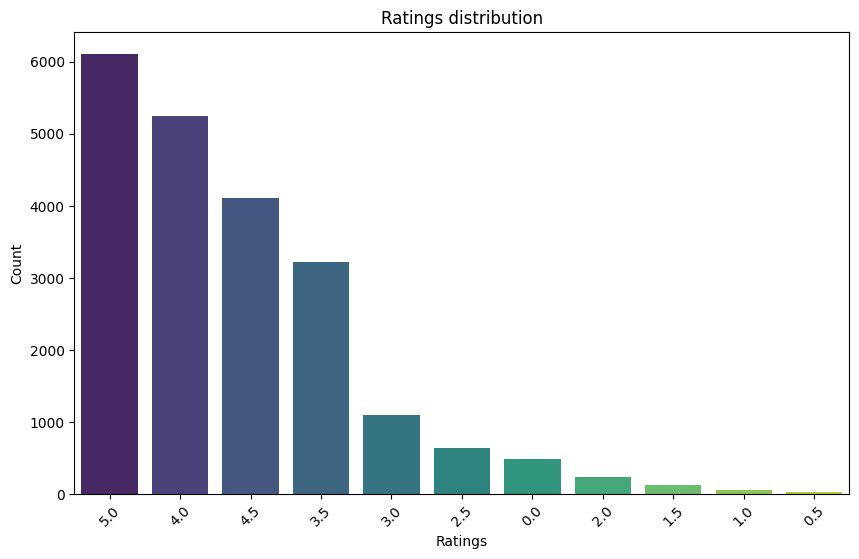

In [458]:
plt.figure(figsize = (10,6))

sns.countplot( x='rating', data = df, order = df['rating'].value_counts().index, palette = 'viridis')
plt.title("Ratings distribution")
plt.xlabel("Ratings")
plt.ylabel("Count")
plt.xticks(rotation = 45)
plt.show()

In [459]:
df['month']=df['month'].astype(int)

In [460]:
df.month.unique()

array([ 5,  6,  7,  2, 12,  4, 11,  3, 10,  9,  1,  8])

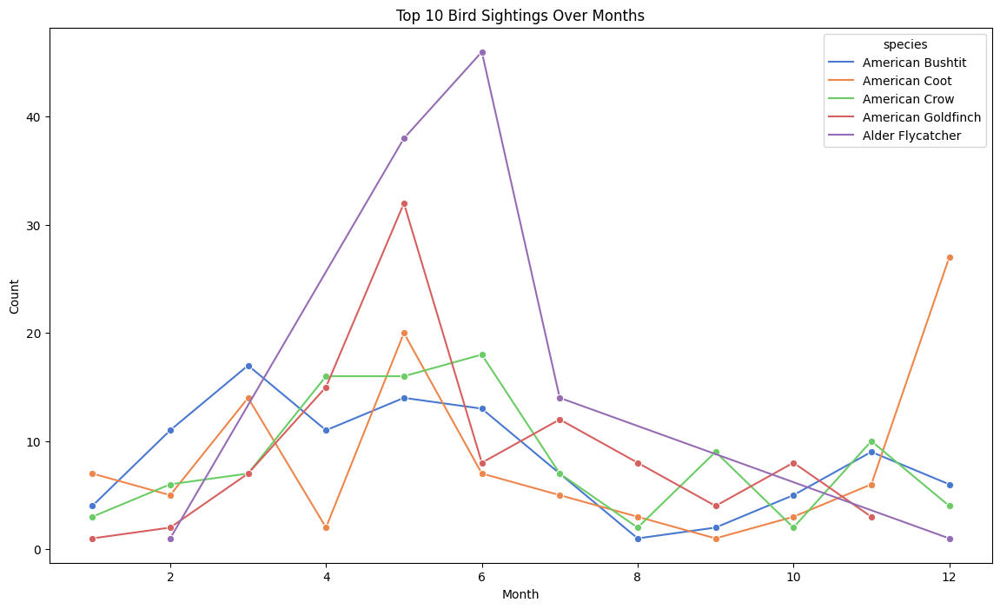

In [461]:
bird_month_counts = df.groupby(['month', 'species']).size().reset_index(name='Count')

# Find the top 10 birds based on overall sightings
top_birds = bird_month_counts.groupby('species')['Count'].sum().nlargest(5).index

# Filter the data for the top 10 birds
top_bird_month_counts = bird_month_counts[bird_month_counts['species'].isin(top_birds)]

# Create a line plot using Seaborn
plt.figure(figsize=(14, 8))
sns.lineplot(x='month', y='Count', hue='species', data=top_bird_month_counts, marker='o', palette='muted')
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Top 10 Bird Sightings Over Months')
plt.legend(title='species', bbox_to_anchor=(1, 1))
plt.show()

In [462]:
df.columns

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'elevation', 'file_type', 'country', 'longitude', 'length', 'time',
       'license', 'month'],
      dtype='object')

> # FEATURE EXTRACTION 

In [463]:
unique_values = df['species'].unique()[:5]
unique_values

array(['Alder Flycatcher', 'American Avocet', 'American Bittern',
       'American Crow', 'American Goldfinch'], dtype=object)

In [464]:
dfs = []

# Extract 2 rows for each unique value
for value in unique_values:
    # Filter rows based on the unique value
    subset = df[df['species'] == value].head(2)
    
    # Append the subset to the result DataFrame
    dfs.append(subset)

df_for_FE = pd.concat(dfs, ignore_index=True)
df_for_FE

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,...,location,latitude,elevation,file_type,country,longitude,length,time,license,month
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,...,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,220,mp3,United States,-92.962,Not specified,8:00,Creative Commons Attribution-ShareAlike 3.0,5
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,...,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,1700,mp3,United States,-82.1106,0-3(s),08:30,Creative Commons Attribution-NonCommercial-Sha...,5
2,3.5,no,ameavo,1 (mono),2012-04-21,Not specified,10,XC133080.mp3,Not specified,American Avocet,...,"Palo Alto Baylands, Santa Clara, California",37.46,NaN,mp3,United States,-122.105,Not specified,07:40,Creative Commons Attribution-ShareAlike 3.0,4
3,4.0,no,ameavo,1 (mono),2013-04-30,Not specified,18,XC139829.mp3,Not specified,American Avocet,...,"Cheyenne, Laramie, Wyoming",41.1267,1800,mp3,United States,-104.697,Not specified,09:00,Creative Commons Attribution-NonCommercial-Sha...,4
4,2.5,no,amebit,2 (stereo),2013-03-25,increasing,20,XC127371.mp3,level,American Bittern,...,"Swan Lake, Victoria, British Columbia",48.461,50,mp3,Canada,-123.375,6-10(s),21:45,Creative Commons Attribution-ShareAlike 3.0,3
5,1.0,no,amebit,1 (mono),2013-04-15,Not specified,22,XC130058.mp3,Not specified,American Bittern,...,United States Caroline New York Nocturnal Fli...,42.343,420,mp3,United States,-76.3,>10(s),00:00,Creative Commons Attribution-NonCommercial-Sha...,4
6,5.0,no,amecro,1 (mono),2012-09-09,Not specified,16,XC109768.mp3,Not specified,American Crow,...,"Westhaven State Park, Grays Harbor Co., Washi...",46.9034,NaN,mp3,United States,-124.1301,Not specified,10:00,Creative Commons Attribution-NonCommercial-Sha...,9
7,4.5,no,amecro,1 (mono),2012-11-12,Not specified,126,XC112598.mp3,Not specified,American Crow,...,"Powderhorn Park, Minneapolis, Hennepin, Minne...",44.942,260,mp3,United States,-93.259,Not specified,08:30,Creative Commons Attribution-ShareAlike 3.0,11
8,5.0,no,amegfi,1 (mono),2012-05-14,Not specified,119,XC109299.mp3,Not specified,American Goldfinch,...,"Deerlodge Park, Dinosaur National Monument, M...",40.44978,1700,mp3,United States,-108.522902,Not specified,07:00,Creative Commons Attribution-NonCommercial-Sha...,5
9,5.0,no,amegfi,1 (mono),2012-05-14,Not specified,153,XC109300.mp3,Not specified,American Goldfinch,...,"Deerlodge Park, Dinosaur National Monument, M...",40.44978,1700,mp3,United States,-108.522902,Not specified,07:00,Creative Commons Attribution-NonCommercial-Sha...,5


In [465]:
y1,sr1 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC134874.mp3")
y2,sr2 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC135454.mp3")

In [466]:
print("Audio1")
ipd.Audio(y1, rate=sr1)

Audio1


In [467]:
y3,sr3 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/ameavo/XC133080.mp3")
y4,sr4 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/ameavo/XC139829.mp3")

In [468]:
print("Audio3")
ipd.Audio(y3, rate=sr3)

Audio3


In [469]:
y5,sr5 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amebit/XC127371.mp3")
y6,sr6 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amebit/XC130058.mp3")

In [470]:
print("Audio5")
ipd.Audio(y5, rate=sr5)

Audio5


In [471]:
y7,sr7 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amecro/XC109768.mp3")
y8,sr8 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amecro/XC112598.mp3")

In [472]:
print("Audio7")
ipd.Audio(y7, rate=sr7)

Audio7


In [473]:
y9,sr9 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amegfi/XC109299.mp3")
y10,sr10 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amegfi/XC109300.mp3")

In [474]:
print("Audio9")
ipd.Audio(y9, rate=sr9)

Audio9


# ZERO CROSSING RATE

In [475]:
zcr1 = librosa.feature.zero_crossing_rate(y1)
print(zcr1)
print("zcr1")
print('max:',zcr1.max())
print('min:',zcr1.min())
print("-------------------------------")
zcr2 = librosa.feature.zero_crossing_rate(y2)
print("zcr2")
print('max:',zcr2.max())
print('min:',zcr2.min())

[[0.18408203 0.26953125 0.34228516 ... 0.3515625  0.34960938 0.26953125]]
zcr1
max: 0.75244140625
min: 0.18408203125
-------------------------------
zcr2
max: 0.55908203125
min: 0.05078125


In [476]:
zcr3 = librosa.feature.zero_crossing_rate(y3)
print("zcr3")
print('max:',zcr3.max())
print('min:',zcr3.min())
print("-------------------------------")
zcr4 = librosa.feature.zero_crossing_rate(y4)
print("zcr4")
print('max:',zcr4.max())
print('min:',zcr4.min())

zcr3
max: 0.49755859375
min: 0.1396484375
-------------------------------
zcr4
max: 0.2822265625
min: 0.03173828125


In [477]:
zcr5 = librosa.feature.zero_crossing_rate(y5)
print("zcr5")
print('max:',zcr5.max())
print('min:',zcr5.min())
print("-------------------------------")
zcr6 = librosa.feature.zero_crossing_rate(y6)
print("zcr6")
print('max:',zcr6.max())
print('min:',zcr6.min())

zcr5
max: 0.20654296875
min: 0.0185546875
-------------------------------
zcr6
max: 0.216796875
min: 0.025390625


In [478]:
zcr7 = librosa.feature.zero_crossing_rate(y7)
print("zcr7")
print('max:',zcr7.max())
print('min:',zcr7.min())
print("-------------------------------")
zcr8 = librosa.feature.zero_crossing_rate(y8)
print("zcr8")
print('max:',zcr8.max())
print('min:',zcr8.min())

zcr7
max: 0.240234375
min: 0.0869140625
-------------------------------
zcr8
max: 0.2802734375
min: 0.05810546875


In [479]:
zcr9 = librosa.feature.zero_crossing_rate(y9)
print("zcr9")
print('max:',zcr9.max())
print('min:',zcr9.min())
print("-------------------------------")
zcr10 = librosa.feature.zero_crossing_rate(y10)
print("zcr10")
print('max:',zcr10.max())
print('min:',zcr10.min())

zcr9
max: 0.60693359375
min: 0.05859375
-------------------------------
zcr10
max: 0.59033203125
min: 0.072265625


Observng the above zero-crossing rate values for each audio file, we can observe a pattern that two audio files of same category bird have similar ranges of zero-crossing rates. And they do show differnece in the zcr values of audio files from different bird categories. As this feature somewhat classifies the two audio groups, so this can be considered further for classification model.

# RMS Energy

In [480]:
#energy (rms)
energy1 = librosa.feature.rms(y=y1)
print(energy1)
print('energy1')
print('max:',energy1.max())
print('min:',energy1.min())
print('mean:',energy1.mean())
print("-------------------------------")
energy2 = librosa.feature.rms(y=y2)
print('energy2')
print('max:',energy2.max())
print('min:',energy2.min())
print('mean:',energy2.mean())

[[0.00156336 0.00226724 0.00277862 ... 0.00084406 0.00066822 0.00055996]]
energy1
max: 0.13091916
min: 4.774282e-06
mean: 0.009436979
-------------------------------
energy2
max: 0.12132841
min: 0.0037610715
mean: 0.01651221


In [481]:
#energy (rms)
energy3 = librosa.feature.rms(y=y3)
print('energy3')
print('max:',energy3.max())
print('min:',energy3.min())
print('mean:',energy3.mean())
print("-------------------------------")
energy4 = librosa.feature.rms(y=y4)
print('energy4')
print('max:',energy4.max())
print('min:',energy4.min())
print('mean:',energy4.mean())

energy3
max: 0.108768515
min: 0.0050918953
mean: 0.03041746
-------------------------------
energy4
max: 0.117402405
min: 0.0040132464
mean: 0.032561403


In [482]:
#energy (rms)
energy5 = librosa.feature.rms(y=y5)
print('energy5')
print('max:',energy5.max())
print('min:',energy5.min())
print('mean:',energy5.mean())
print("-------------------------------")
energy6 = librosa.feature.rms(y=y6)
print('energy6')
print('max:',energy6.max())
print('min:',energy6.min())
print('mean:',energy6.mean())

energy5
max: 0.09951094
min: 0.02622654
mean: 0.039170116
-------------------------------
energy6
max: 0.006229232
min: 0.00026452466
mean: 0.0027368567


In [483]:
#energy (rms)
energy7 = librosa.feature.rms(y=y7)
print('energy7')
print('max:',energy7.max())
print('min:',energy7.min())
print('mean:',energy7.mean())
print("-------------------------------")
energy8 = librosa.feature.rms(y=y8)
print('energy8')
print('max:',energy8.max())
print('min:',energy8.min())
print('mean:',energy8.mean())

energy7
max: 0.24768768
min: 0.0021838462
mean: 0.04979504
-------------------------------
energy8
max: 0.2814928
min: 0.00016877841
mean: 0.01957166


In [484]:
#energy (rms)
energy9 = librosa.feature.rms(y=y9)
print('energy9')
print('max:',energy9.max())
print('min:',energy9.min())
print('mean:',energy9.mean())
print("-------------------------------")
energy10 = librosa.feature.rms(y=y10)
print('energy10')
print('max:',energy10.max())
print('min:',energy10.min())
print('mean:',energy10.mean())

energy9
max: 0.1333658
min: 0.00024129495
mean: 0.0058071394
-------------------------------
energy10
max: 0.31734416
min: 0.00025861064
mean: 0.022343852


From above avg. values for rms energy for each audio file, we can not derive any clear pattern of values and resemblance that can be used for classifying the audio groups.

# Spectral Roll-off

In [485]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y1))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr1, roll_percent=0.85)
print("audio1 spectral rolloff:",rolloff.mean())

audio1 spectral rolloff: 6477.866050845287


In [486]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y2))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr2, roll_percent=0.85)
print("audio2 spectral rolloff:",rolloff.mean())

audio2 spectral rolloff: 5637.761561401055


In [487]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y3))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr3, roll_percent=0.85)
print("audio3 spectral rolloff:",rolloff.mean())

audio3 spectral rolloff: 5828.0778214738175


In [488]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y4))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr4, roll_percent=0.85)
print("audio4 spectral rolloff:",rolloff.mean())

audio4 spectral rolloff: 3179.5379717123233


In [489]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y5))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr5, roll_percent=0.85)
print("audio5 spectral rolloff:",rolloff.mean())

audio5 spectral rolloff: 2069.9825548875874


In [490]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y6))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr6, roll_percent=0.85)
print("audio6 spectral rolloff:",rolloff.mean())

audio6 spectral rolloff: 2907.963230298913


In [491]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y7))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr7, roll_percent=0.85)
print("audio7 spectral rolloff:",rolloff.mean())

audio7 spectral rolloff: 4360.534893703325


In [492]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y8))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr8, roll_percent=0.85)
print("audio8 spectral rolloff:",rolloff.mean())

audio8 spectral rolloff: 4890.945079558486


In [493]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y9))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr9, roll_percent=0.85)
print("audio9 spectral rolloff:",rolloff.mean())

audio9 spectral rolloff: 5836.336028255082


In [494]:
#spectral roll-off
S, phase = librosa.magphase(librosa.stft(y10))
rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr10, roll_percent=0.85)
print("audio10 spectral rolloff:",rolloff.mean())

audio10 spectral rolloff: 5837.306888131297


Here we see that avg. values for spectral rolloff for each audio file do not reveal any particular pattern of values and resemblance that can be further used for classifying the audio groups. They have some mixed range of values that can not classified clearly.

# MFCCs

In [495]:
mfcc1 = librosa.feature.mfcc(y=y1, sr=sr1)
print(mfcc1)
print("mfcc1")
print("max of mean-mfcc:",np.mean(mfcc1, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc1, axis=1).min())

[[-5.6081122e+02 -4.4332037e+02 -4.1061981e+02 ... -5.6940411e+02
  -6.0178583e+02 -6.3972290e+02]
 [-1.9227095e+01 -2.6288570e+01 -2.9130209e+01 ... -2.0058197e+01
  -1.8107815e+01 -6.9560318e+00]
 [-6.4770027e+01 -7.9900223e+01 -8.3031021e+01 ... -5.4851036e+01
  -3.2044701e+01 -1.2029111e+00]
 ...
 [-5.2577453e+00  3.4333315e+00  5.5196247e+00 ... -1.0299748e+01
  -1.4641129e+01 -7.3553495e+00]
 [ 5.3074884e+00  1.8119075e+00 -3.2101498e+00 ...  6.5151749e+00
   7.4062176e+00  1.6373640e+00]
 [-5.9028918e-01  3.9094360e+00  2.2300286e+00 ...  3.0444243e+00
   3.8391652e+00  3.4339571e+00]]
mfcc1
max of mean-mfcc: 19.510612
min of mean-mfcc: -401.81308


In [496]:
mfcc2 = librosa.feature.mfcc(y=y2, sr=sr2)
print("mfcc2")
print("max of mean-mfcc:",np.mean(mfcc2, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc2, axis=1).min())

mfcc2
max of mean-mfcc: 57.429516
min of mean-mfcc: -292.4762


In [497]:
mfcc3 = librosa.feature.mfcc(y=y3, sr=sr3)
print("mfcc3")
print("max of mean-mfcc:",np.mean(mfcc3, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc3, axis=1).min())

mfcc3
max of mean-mfcc: 34.119373
min of mean-mfcc: -255.63048


In [498]:
mfcc4 = librosa.feature.mfcc(y=y4, sr=sr4)
print("mfcc4")
print("max of mean-mfcc:",np.mean(mfcc4, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc4, axis=1).min())

mfcc4
max of mean-mfcc: 77.94662
min of mean-mfcc: -339.10413


In [499]:
mfcc5 = librosa.feature.mfcc(y=y5, sr=sr5)
print("mfcc5")
print("max of mean-mfcc:",np.mean(mfcc5, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc5, axis=1).min())

mfcc5
max of mean-mfcc: 170.73468
min of mean-mfcc: -242.49837


In [500]:
mfcc6 = librosa.feature.mfcc(y=y6, sr=sr6)
print("mfcc6")
print("max of mean-mfcc:",np.mean(mfcc6, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc6, axis=1).min())

mfcc6
max of mean-mfcc: 170.82881
min of mean-mfcc: -544.754


In [501]:
mfcc7 = librosa.feature.mfcc(y=y7, sr=sr7)
print("mfcc7")
print("max of mean-mfcc:",np.mean(mfcc7, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc7, axis=1).min())

mfcc7
max of mean-mfcc: 63.210934
min of mean-mfcc: -282.763


In [502]:
mfcc8 = librosa.feature.mfcc(y=y8, sr=sr8)
print("mfcc8")
print("max of mean-mfcc:",np.mean(mfcc8, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc8, axis=1).min())

mfcc8
max of mean-mfcc: 84.127205
min of mean-mfcc: -303.6717


In [503]:
mfcc9 = librosa.feature.mfcc(y=y9, sr=sr9)
print("mfcc9")
print("max of mean-mfcc:",np.mean(mfcc9, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc9, axis=1).min())

mfcc9
max of mean-mfcc: 50.832138
min of mean-mfcc: -482.66742


In [504]:
mfcc10 = librosa.feature.mfcc(y=y10, sr=sr10)
print("mfcc10")
print("max of mean-mfcc:",np.mean(mfcc10, axis=1).max())
print("min of mean-mfcc:",np.mean(mfcc10, axis=1).min())

mfcc10
max of mean-mfcc: 10.873558
min of mean-mfcc: -495.09653


Here we can observe that mean mfccs values do follow some pattern. Two audio files from each categpry of bird do share some similarities in the mfcc values. There statisctical values will be helpful in classification model.

# Spectral Flux

In [505]:
#spectral flux
onset_env = librosa.onset.onset_strength(y=y1, sr=sr1)
print("spectral flux for Audio1")
print(onset_env)
print(onset_env.mean())
print("----------------------------------------")
onset_env = librosa.onset.onset_strength(y=y2, sr=sr2)
print("spectral flux for Audio2")
print(onset_env.mean())

spectral flux for Audio1
[0.         0.         0.         ... 0.28001472 0.21768387 0.39724785]
1.0831001
----------------------------------------
spectral flux for Audio2
1.2134764


In [506]:
onset_env = librosa.onset.onset_strength(y=y3, sr=sr3)
print("spectral flux for Audio3")
print(onset_env.mean())
print("----------------------------------------")
onset_env = librosa.onset.onset_strength(y=y4, sr=sr4)
print("spectral flux for Audio4")
print(onset_env.mean())

spectral flux for Audio3
1.3323127
----------------------------------------
spectral flux for Audio4
1.6186296


In [507]:
onset_env = librosa.onset.onset_strength(y=y5, sr=sr5)
print("spectral flux for Audio5")
print(onset_env.mean())
print("----------------------------------------")
onset_env = librosa.onset.onset_strength(y=y6, sr=sr6)
print("spectral flux for Audio6")
print(onset_env.mean())

spectral flux for Audio5
1.1831691
----------------------------------------
spectral flux for Audio6
0.78582954


In [508]:
onset_env = librosa.onset.onset_strength(y=y7, sr=sr7)
print("spectral flux for Audio7")
print(onset_env.mean())
print("----------------------------------------")
onset_env = librosa.onset.onset_strength(y=y8, sr=sr8)
print("spectral flux for Audio6")
print(onset_env.mean())

spectral flux for Audio7
1.3457237
----------------------------------------
spectral flux for Audio6
1.0948359


In [509]:
onset_env = librosa.onset.onset_strength(y=y9, sr=sr9)
print("spectral flux for Audio9")
print(onset_env.mean())
print("----------------------------------------")
onset_env = librosa.onset.onset_strength(y=y10, sr=sr10)
print("spectral flux for Audio10")
print(onset_env.mean())

spectral flux for Audio9
1.2062277
----------------------------------------
spectral flux for Audio10
1.3391225


Observing values, we can't clearly find any distinction pattern.

# Spectrogram

Observing the fourier transforms of audio files will reveal innformation about  the magnitude of the frequency components at different time frames. This will be useful for identifying the key frequency components.

In [510]:
spec = np.abs(librosa.stft(y1))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

0.43316737
2.1033875e-06


In [511]:
spec = np.abs(librosa.stft(y2))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

1.0148797
1.5049702e-07


In [512]:
spec = np.abs(librosa.stft(y3))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

2.0785434
3.5417642e-07


In [513]:
spec = np.abs(librosa.stft(y4))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

2.113501
3.8926523e-06


In [514]:
spec = np.abs(librosa.stft(y5))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

8.139118
2.295115e-05


In [515]:
spec = np.abs(librosa.stft(y6))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

0.2183409
1.8505384e-08


In [516]:
spec = np.abs(librosa.stft(y7))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

3.9356153
2.87992e-06


In [517]:
spec = np.abs(librosa.stft(y8))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

2.153391
1.538519e-07


In [518]:
spec = np.abs(librosa.stft(y9))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

0.3089714
6.706447e-07


In [519]:
spec = np.abs(librosa.stft(y10))
mean_per_bin = np.mean(spec, axis=1)
print(mean_per_bin.max())
print(mean_per_bin.min())

1.2464862
3.1165728e-06


AttributeError: module 'librosa' has no attribute 'display'

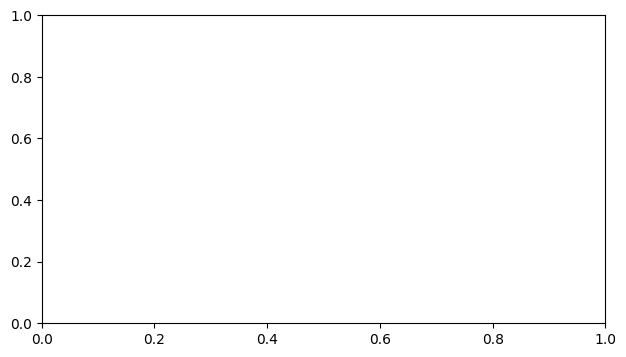

In [520]:
# Spectrogram for Audio 1
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y1)), ref=np.max)

# Spectrogram for Audio 2
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max)

# Create subplots
plt.figure(figsize=(16, 4))

# Plot for Audio 1
plt.subplot(1, 2, 1)
librosa.display.specshow(D1, sr=sr1, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 1')

# Plot for Audio 2
plt.subplot(1, 2, 2)
librosa.display.specshow(D2, sr=sr2, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 2')

# Adjust layout for better visualization
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y3)), ref=np.max)
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y4)), ref=np.max)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
librosa.display.specshow(D1, sr=sr3, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 3')

plt.subplot(1, 2, 2)
librosa.display.specshow(D2, sr=sr4, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 4')

plt.tight_layout()
plt.show()

In [ ]:
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y5)), ref=np.max)
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y6)), ref=np.max)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
librosa.display.specshow(D1, sr=sr5, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 5')

plt.subplot(1, 2, 2)
librosa.display.specshow(D2, sr=sr6, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 6')

plt.tight_layout()
plt.show()

In [ ]:
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y7)), ref=np.max)
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y8)), ref=np.max)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
librosa.display.specshow(D1, sr=sr7, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 7')

plt.subplot(1, 2, 2)
librosa.display.specshow(D2, sr=sr8, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 8')

plt.tight_layout()
plt.show()

In [ ]:
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y9)), ref=np.max)
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(y10)), ref=np.max)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
librosa.display.specshow(D1, sr=sr9, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 9')

plt.subplot(1, 2, 2)
librosa.display.specshow(D2, sr=sr10, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Audio 10')

plt.tight_layout()
plt.show()

# MODEL

In [ ]:
!pip install librosa==0.9.2

Due to some modification in new version of librosa, the melspectrogram feature was not working properly that's why installed, older version of librosa to work with.

In [ ]:
import cv2
import audioread
import logging
import os
import random
import time
import warnings

import librosa
import numpy as np
import pandas as pd
import soundfile as sf
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data

from contextlib import contextmanager
from pathlib import Path
from typing import Optional

from fastprogress import progress_bar
from sklearn.metrics import f1_score
from torchvision import models

# Utilities

In [ ]:
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  # type: ignore
    torch.backends.cudnn.deterministic = True  # type: ignore
    torch.backends.cudnn.benchmark = True  # type: ignore
    
    
def get_logger(out_file=None):
    logger = logging.getLogger()
    formatter = logging.Formatter("%(asctime)s - %(levelname)s - %(message)s")
    logger.handlers = []
    logger.setLevel(logging.INFO)

    handler = logging.StreamHandler()
    handler.setFormatter(formatter)
    handler.setLevel(logging.INFO)
    logger.addHandler(handler)

    if out_file is not None:
        fh = logging.FileHandler(out_file)
        fh.setFormatter(formatter)
        fh.setLevel(logging.INFO)
        logger.addHandler(fh)
    logger.info("logger set up")
    return logger
    
    
@contextmanager
def timer(name: str, logger: Optional[logging.Logger] = None):
    t0 = time.time()
    msg = f"[{name}] start"
    if logger is None:
        print(msg)
    else:
        logger.info(msg)
    yield

    msg = f"[{name}] done in {time.time() - t0:.2f} s"
    if logger is None:
        print(msg)
    else:
        logger.info(msg)

In [ ]:
logger = get_logger("main.log")
set_seed(1213)

# Data Loading

In [ ]:
TARGET_SR = 32000
TEST = Path("../input/birdsong-recognition/test_audio").exists()

In [ ]:
if TEST:
    DATA_DIR = Path("../input/birdsong-recognition/")
else:
    # dataset created by @shonenkov, thanks!
    DATA_DIR = Path("../input/birdcall-check/")
    

test = pd.read_csv(DATA_DIR / "test.csv")
test_audio = DATA_DIR / "test_audio"


test.head()

In [ ]:
sub = pd.read_csv("../input/birdsong-recognition/sample_submission.csv")
sub.to_csv("submission.csv", index=False)  # this will be overwritten if everything goes well

In [ ]:
class ResNet(nn.Module):
    def __init__(self, base_model_name: str, pretrained=False,
                 num_classes=264):
        super().__init__()
        base_model = models.__getattribute__(base_model_name)(
            pretrained=pretrained)
        layers = list(base_model.children())[:-2]
        layers.append(nn.AdaptiveMaxPool2d(1))
        self.encoder = nn.Sequential(*layers)

        in_features = base_model.fc.in_features

        self.classifier = nn.Sequential(
            nn.Linear(in_features, 1024), nn.ReLU(), nn.Dropout(p=0.2),
            nn.Linear(1024, 1024), nn.ReLU(), nn.Dropout(p=0.2),
            nn.Linear(1024, num_classes))

    def forward(self, x):
        batch_size = x.size(0)
        x = self.encoder(x).view(batch_size, -1)
        x = self.classifier(x)
        multiclass_proba = F.softmax(x, dim=1)
        multilabel_proba = F.sigmoid(x)
        return {
            "logits": x,
            "multiclass_proba": multiclass_proba,
            "multilabel_proba": multilabel_proba
        }

# Parameters

In [ ]:
model_config = {
    "base_model_name": "resnet50",
    "pretrained": False,
    "num_classes": 264
}

melspectrogram_parameters = {
    "n_mels": 128,
    "fmin": 20,
    "fmax": 16000
}

weights_path = "/kaggle/input/birdcall-resnet50-init-weights/best.pth"

In [ ]:
from sklearn.preprocessing import LabelEncoder
df = pd.read_csv("/kaggle/input/birdsong-recognition/train.csv")

unique_bird_names = df.ebird_code.unique()
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(unique_bird_names)
BIRD_CODE = dict(zip(unique_bird_names, encoded_labels))

#for bird_name, label in BIRD_CODE.items():
#    print(f"{bird_name}:{label}")

INV_BIRD_CODE = {v: k for k, v in BIRD_CODE.items()}
#for bird_name, label in INV_BIRD_CODE.items():
#    print(f"{bird_name}:{label}")

# Define Dataset

In [521]:
def mono_to_color(X: np.ndarray,
                  mean=None,
                  std=None,
                  norm_max=None,
                  norm_min=None,
                  eps=1e-6):
    
    # Stack X as [X,X,X]
    X = np.stack([X, X, X], axis=-1)

    # Standardize
    mean = mean or X.mean()
    X = X - mean
    std = std or X.std()
    Xstd = X / (std + eps)
    _min, _max = Xstd.min(), Xstd.max()
    norm_max = norm_max or _max
    norm_min = norm_min or _min
    if (_max - _min) > eps:
        # Normalize to [0, 255]
        V = Xstd
        V[V < norm_min] = norm_min
        V[V > norm_max] = norm_max
        V = 255 * (V - norm_min) / (norm_max - norm_min)
        V = V.astype(np.uint8)
    else:
        # Just zero
        V = np.zeros_like(Xstd, dtype=np.uint8)
    return V


class TestDataset(data.Dataset):
    def __init__(self, df: pd.DataFrame, clip: np.ndarray,
                 img_size=224, melspectrogram_parameters={}):
        self.df = df
        self.clip = clip
        self.img_size = img_size
        self.melspectrogram_parameters = melspectrogram_parameters
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx: int):
        SR = 32000
        sample = self.df.loc[idx, :]
        site = sample.site
        row_id = sample.row_id
        
        if site == "site_3":
            y = self.clip.astype(np.float32)
            len_y = len(y)
            start = 0
            end = SR * 5
            images = []
            while len_y > start:
                y_batch = y[start:end].astype(np.float32)
                if len(y_batch) != (SR * 5):
                    break
                start = end
                end = end + SR * 5
                
                melspec = librosa.feature.melspectrogram(y_batch,
                                                         sr=SR,
                                                         **self.melspectrogram_parameters)
                melspec = librosa.power_to_db(melspec).astype(np.float32)
                image = mono_to_color(melspec)
                height, width, _ = image.shape
                image = cv2.resize(image, (int(width * self.img_size / height), self.img_size))
                image = np.moveaxis(image, 2, 0)
                image = (image / 255.0).astype(np.float32)
                images.append(image)
            images = np.asarray(images)
            return images, row_id, site
        else:
            end_seconds = int(sample.seconds)
            start_seconds = int(end_seconds - 5)
            
            start_index = SR * start_seconds
            end_index = SR * end_seconds
            
            y = self.clip[start_index:end_index].astype(np.float32)

            melspec = librosa.feature.melspectrogram(y, sr=SR, **self.melspectrogram_parameters)
            melspec = librosa.power_to_db(melspec).astype(np.float32)

            image = mono_to_color(melspec)
            height, width, _ = image.shape
            image = cv2.resize(image, (int(width * self.img_size / height), self.img_size))
            image = np.moveaxis(image, 2, 0)
            image = (image / 255.0).astype(np.float32)

            return image, row_id, site

# Prediction loop

In [522]:
def get_model(config: dict, weights_path: str):
    model = ResNet(**config)
    checkpoint = torch.load(weights_path)
    model.load_state_dict(checkpoint["model_state_dict"])
    device = torch.device("cuda")
    model.to(device)
    model.eval()
    return model

In [523]:
def prediction_for_clip(test_df: pd.DataFrame, 
                        clip: np.ndarray, 
                        model: ResNet, 
                        mel_params: dict, 
                        threshold=0.5):

    dataset = TestDataset(df=test_df, 
                          clip=clip,
                          img_size=224,
                          melspectrogram_parameters=mel_params)
    loader = data.DataLoader(dataset, batch_size=1, shuffle=False)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    model.eval()
    prediction_dict = {}
    for image, row_id, site in progress_bar(loader):
        site = site[0]
        row_id = row_id[0]
        if site in {"site_1", "site_2"}:
            image = image.to(device)

            with torch.no_grad():
                prediction = model(image)
                proba = prediction["multilabel_proba"].detach().cpu().numpy().reshape(-1)

            events = proba >= threshold
            labels = np.argwhere(events).reshape(-1).tolist()

        else:
            # to avoid prediction on large batch
            image = image.squeeze(0)
            batch_size = 16
            whole_size = image.size(0)
            if whole_size % batch_size == 0:
                n_iter = whole_size // batch_size
            else:
                n_iter = whole_size // batch_size + 1
                
            all_events = set()
            for batch_i in range(n_iter):
                batch = image[batch_i * batch_size:(batch_i + 1) * batch_size]
                if batch.ndim == 3:
                    batch = batch.unsqueeze(0)

                batch = batch.to(device)
                with torch.no_grad():
                    prediction = model(batch)
                    proba = prediction["multilabel_proba"].detach().cpu().numpy()
                    
                events = proba >= threshold
                for i in range(len(events)):
                    event = events[i, :]
                    labels = np.argwhere(event).reshape(-1).tolist()
                    for label in labels:
                        all_events.add(label)
                        
            labels = list(all_events)
        if len(labels) == 0:
            prediction_dict[row_id] = "nocall"
        else:
            labels_str_list = list(map(lambda x: INV_BIRD_CODE[x], labels))
            label_string = " ".join(labels_str_list)
            prediction_dict[row_id] = label_string
    return prediction_dict

In [524]:
def prediction(test_df: pd.DataFrame,
               test_audio: Path,
               model_config: dict,
               mel_params: dict,
               weights_path: str,
               threshold=0.5):
    model = get_model(model_config, weights_path)
    unique_audio_id = test_df.audio_id.unique()

    warnings.filterwarnings("ignore")
    prediction_dfs = []
    for audio_id in unique_audio_id:
        with timer(f"Loading {audio_id}", logger):
            clip, _ = librosa.load(test_audio / (audio_id + ".mp3"),
                                   sr=TARGET_SR,
                                   mono=True)
        
        test_df_for_audio_id = test_df.query(
            f"audio_id == '{audio_id}'").reset_index(drop=True)
        with timer(f"Prediction on {audio_id}", logger):
            prediction_dict = prediction_for_clip(test_df_for_audio_id,
                                                  clip=clip,
                                                  model=model,
                                                  mel_params=mel_params,
                                                  threshold=threshold)
        row_id = list(prediction_dict.keys())
        birds = list(prediction_dict.values())
        prediction_df = pd.DataFrame({
            "row_id": row_id,
            "birds": birds
        })
        prediction_dfs.append(prediction_df)
    
    prediction_df = pd.concat(prediction_dfs, axis=0, sort=False).reset_index(drop=True)
    return prediction_df

# Prediction

In [525]:
submission = prediction(test_df=test,
                        test_audio=test_audio,
                        model_config=model_config,
                        mel_params=melspectrogram_parameters,
                        weights_path=weights_path,
                        threshold=0.8)
submission.to_csv("submission.csv", index=False)

2024-01-11 18:54:03,501 - INFO - [Loading 41e6fe6504a34bf6846938ba78d13df1] start
2024-01-11 18:54:04,141 - INFO - [Loading 41e6fe6504a34bf6846938ba78d13df1] done in 0.64 s
2024-01-11 18:54:04,146 - INFO - [Prediction on 41e6fe6504a34bf6846938ba78d13df1] start


2024-01-11 18:54:04,460 - INFO - [Prediction on 41e6fe6504a34bf6846938ba78d13df1] done in 0.31 s
2024-01-11 18:54:04,462 - INFO - [Loading cce64fffafed40f2b2f3d3413ec1c4c2] start
2024-01-11 18:54:05,517 - INFO - [Loading cce64fffafed40f2b2f3d3413ec1c4c2] done in 1.05 s
2024-01-11 18:54:05,522 - INFO - [Prediction on cce64fffafed40f2b2f3d3413ec1c4c2] start


2024-01-11 18:54:05,941 - INFO - [Prediction on cce64fffafed40f2b2f3d3413ec1c4c2] done in 0.42 s
2024-01-11 18:54:05,943 - INFO - [Loading 99af324c881246949408c0b1ae54271f] start
2024-01-11 18:54:07,051 - INFO - [Loading 99af324c881246949408c0b1ae54271f] done in 1.11 s
2024-01-11 18:54:07,056 - INFO - [Prediction on 99af324c881246949408c0b1ae54271f] start


2024-01-11 18:54:07,383 - INFO - [Prediction on 99af324c881246949408c0b1ae54271f] done in 0.33 s
2024-01-11 18:54:07,385 - INFO - [Loading 6ab74e177aa149468a39ca10beed6222] start
2024-01-11 18:54:08,386 - INFO - [Loading 6ab74e177aa149468a39ca10beed6222] done in 1.00 s
2024-01-11 18:54:08,389 - INFO - [Prediction on 6ab74e177aa149468a39ca10beed6222] start


2024-01-11 18:54:08,825 - INFO - [Prediction on 6ab74e177aa149468a39ca10beed6222] done in 0.44 s
2024-01-11 18:54:08,827 - INFO - [Loading b2fd3f01e9284293a1e33f9c811a2ed6] start
2024-01-11 18:54:09,822 - INFO - [Loading b2fd3f01e9284293a1e33f9c811a2ed6] done in 0.99 s
2024-01-11 18:54:09,826 - INFO - [Prediction on b2fd3f01e9284293a1e33f9c811a2ed6] start


2024-01-11 18:54:10,210 - INFO - [Prediction on b2fd3f01e9284293a1e33f9c811a2ed6] done in 0.38 s
2024-01-11 18:54:10,212 - INFO - [Loading de62b37ebba749d2abf29d4a493ea5d4] start
2024-01-11 18:54:10,468 - INFO - [Loading de62b37ebba749d2abf29d4a493ea5d4] done in 0.26 s
2024-01-11 18:54:10,472 - INFO - [Prediction on de62b37ebba749d2abf29d4a493ea5d4] start


2024-01-11 18:54:10,517 - INFO - [Prediction on de62b37ebba749d2abf29d4a493ea5d4] done in 0.04 s
2024-01-11 18:54:10,518 - INFO - [Loading 8680a8dd845d40f296246dbed0d37394] start
2024-01-11 18:54:11,889 - INFO - [Loading 8680a8dd845d40f296246dbed0d37394] done in 1.37 s
2024-01-11 18:54:11,894 - INFO - [Prediction on 8680a8dd845d40f296246dbed0d37394] start


2024-01-11 18:54:12,586 - INFO - [Prediction on 8680a8dd845d40f296246dbed0d37394] done in 0.69 s
2024-01-11 18:54:12,595 - INFO - [Loading 940d546e5eb745c9a74bce3f35efa1f9] start
2024-01-11 18:54:14,641 - INFO - [Loading 940d546e5eb745c9a74bce3f35efa1f9] done in 2.05 s
2024-01-11 18:54:14,645 - INFO - [Prediction on 940d546e5eb745c9a74bce3f35efa1f9] start


2024-01-11 18:54:15,302 - INFO - [Prediction on 940d546e5eb745c9a74bce3f35efa1f9] done in 0.66 s
2024-01-11 18:54:15,308 - INFO - [Loading 07ab324c602e4afab65ddbcc746c31b5] start
2024-01-11 18:54:16,078 - INFO - [Loading 07ab324c602e4afab65ddbcc746c31b5] done in 0.77 s
2024-01-11 18:54:16,082 - INFO - [Prediction on 07ab324c602e4afab65ddbcc746c31b5] start


2024-01-11 18:54:16,305 - INFO - [Prediction on 07ab324c602e4afab65ddbcc746c31b5] done in 0.22 s
2024-01-11 18:54:16,307 - INFO - [Loading 899616723a32409c996f6f3441646c2a] start
2024-01-11 18:54:17,807 - INFO - [Loading 899616723a32409c996f6f3441646c2a] done in 1.50 s
2024-01-11 18:54:17,810 - INFO - [Prediction on 899616723a32409c996f6f3441646c2a] start


2024-01-11 18:54:18,281 - INFO - [Prediction on 899616723a32409c996f6f3441646c2a] done in 0.47 s
2024-01-11 18:54:18,282 - INFO - [Loading 9cc5d9646f344f1bbb52640a988fe902] start
2024-01-11 18:54:26,022 - INFO - [Loading 9cc5d9646f344f1bbb52640a988fe902] done in 7.74 s
2024-01-11 18:54:26,026 - INFO - [Prediction on 9cc5d9646f344f1bbb52640a988fe902] start


2024-01-11 18:54:27,975 - INFO - [Prediction on 9cc5d9646f344f1bbb52640a988fe902] done in 1.95 s
2024-01-11 18:54:27,977 - INFO - [Loading a56e20a518684688a9952add8a9d5213] start
2024-01-11 18:54:28,868 - INFO - [Loading a56e20a518684688a9952add8a9d5213] done in 0.89 s
2024-01-11 18:54:28,873 - INFO - [Prediction on a56e20a518684688a9952add8a9d5213] start


2024-01-11 18:54:29,074 - INFO - [Prediction on a56e20a518684688a9952add8a9d5213] done in 0.20 s
2024-01-11 18:54:29,076 - INFO - [Loading 96779836288745728306903d54e264dd] start
2024-01-11 18:54:29,674 - INFO - [Loading 96779836288745728306903d54e264dd] done in 0.60 s
2024-01-11 18:54:29,677 - INFO - [Prediction on 96779836288745728306903d54e264dd] start


2024-01-11 18:54:29,812 - INFO - [Prediction on 96779836288745728306903d54e264dd] done in 0.13 s
2024-01-11 18:54:29,813 - INFO - [Loading f77783ba4c6641bc918b034a18c23e53] start
2024-01-11 18:54:30,125 - INFO - [Loading f77783ba4c6641bc918b034a18c23e53] done in 0.31 s
2024-01-11 18:54:30,129 - INFO - [Prediction on f77783ba4c6641bc918b034a18c23e53] start


2024-01-11 18:54:30,176 - INFO - [Prediction on f77783ba4c6641bc918b034a18c23e53] done in 0.05 s
2024-01-11 18:54:30,178 - INFO - [Loading 856b194b097441958697c2bcd1f63982] start
2024-01-11 18:54:31,062 - INFO - [Loading 856b194b097441958697c2bcd1f63982] done in 0.88 s
2024-01-11 18:54:31,066 - INFO - [Prediction on 856b194b097441958697c2bcd1f63982] start


2024-01-11 18:54:31,260 - INFO - [Prediction on 856b194b097441958697c2bcd1f63982] done in 0.19 s


In [526]:
submission

,row_id,birds
0,site_1_41e6fe6504a34bf6846938ba78d13df1_5,aldfly
1,site_1_41e6fe6504a34bf6846938ba78d13df1_10,aldfly
2,site_1_41e6fe6504a34bf6846938ba78d13df1_15,aldfly
3,site_1_41e6fe6504a34bf6846938ba78d13df1_20,nocall
4,site_1_41e6fe6504a34bf6846938ba78d13df1_25,aldfly
...,...,...
71,site_3_9cc5d9646f344f1bbb52640a988fe902,aldfly
72,site_3_a56e20a518684688a9952add8a9d5213,aldfly
73,site_3_96779836288745728306903d54e264dd,aldfly
74,site_3_f77783ba4c6641bc918b034a18c23e53,aldfly


In [527]:
submission.row_id.unique()

array(['site_1_41e6fe6504a34bf6846938ba78d13df1_5',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_10',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_15',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_20',
       'site_1_41e6fe6504a34bf6846938ba78d13df1_25',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_5',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_10',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_15',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_20',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_25',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_30',
       'site_1_cce64fffafed40f2b2f3d3413ec1c4c2_35',
       'site_1_99af324c881246949408c0b1ae54271f_5',
       'site_1_99af324c881246949408c0b1ae54271f_10',
       'site_1_99af324c881246949408c0b1ae54271f_15',
       'site_1_99af324c881246949408c0b1ae54271f_20',
       'site_1_99af324c881246949408c0b1ae54271f_25',
       'site_1_99af324c881246949408c0b1ae54271f_30',
       'site_1_99af324c881246949408c0b1ae54271f_3

In [528]:
df1 = pd.read_csv("/kaggle/working/submission.csv")

# Remove trailing numbers and duplicates from 'row_id' column
df1['row_id'] = df1['row_id'].replace(to_replace=r'_[0-9]+$', value='', regex=True)
df1 = df1.drop_duplicates()
rows = df1[df1.duplicated(subset=['row_id'], keep=False) & (df1['birds'] == 'nocall')]
df_no_duplicates = df1.drop(rows.index)

df_no_duplicates = df_no_duplicates.reset_index(drop=True)

df_no_duplicates

,row_id,birds
0,site_1_41e6fe6504a34bf6846938ba78d13df1,aldfly
1,site_1_cce64fffafed40f2b2f3d3413ec1c4c2,aldfly
2,site_1_99af324c881246949408c0b1ae54271f,aldfly
3,site_1_6ab74e177aa149468a39ca10beed6222,aldfly
4,site_1_b2fd3f01e9284293a1e33f9c811a2ed6,aldfly
5,site_2_de62b37ebba749d2abf29d4a493ea5d4,aldfly
6,site_2_8680a8dd845d40f296246dbed0d37394,aldfly
7,site_2_940d546e5eb745c9a74bce3f35efa1f9,aldfly
8,site_2_07ab324c602e4afab65ddbcc746c31b5,aldfly
9,site_2_899616723a32409c996f6f3441646c2a,nocall
